<a href="https://colab.research.google.com/github/JesusZabala05/EDA-RL/blob/main/Proyecto_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import plotly.express as px
pd.set_option('display.max_columns', 40)
import warnings
warnings.filterwarnings("ignore")
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import geopandas as gpd

In [12]:
#Auto EDA
#!pip install pandas-profiling
from ydata_profiling import ProfileReport

In [ ]:
#LINK DE GUIA: https://github.com/ijlm/Test-Fraude/blob/main/notebook/exploration.ipynb

In [14]:
df=pd.read_csv('/content/county_damages_by_sector (1).csv') #Data de trabajo
df

,State Code,County Name,County FIPS code,County Population (in 2012),County Income (in 2012),Agricultural Damage (%) (4 major crops),Mortality (deaths per 100k),Energy Expenditures (%),Labor Low-risk (%),Labor High-risk (%),Coastal damage (log10(% county income)),Property Crime (%),Violent Crime (%),Total damages (% county income)
0,AL,Autauga County,1001,55192,35106,-16.003536,27.024584,11.998686,-0.515579,-2.120601,-2.051729,0.052951,2.369668,9.43900
1,AL,Baldwin County,1003,190560,38228,-12.974306,31.895386,12.066700,-0.378806,-1.937923,-0.698060,0.147257,2.495164,9.40780
2,AL,Barbour County,1005,27169,28431,-6.562765,25.534552,11.380579,-0.394443,-1.976559,-1.961138,0.151926,2.528313,10.87200
3,AL,Bibb County,1007,22634,27109,NaN,22.530268,12.070424,-0.428851,-1.934934,-1.940463,0.187312,2.525677,10.77700
4,AL,Blount County,1009,57748,29513,-18.488190,20.003851,11.908128,-0.374522,-1.854808,-1.976278,0.283651,2.659189,8.98490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,WY,Sweetwater County,56037,45115,55207,NaN,-11.996678,2.039927,-0.164995,-1.279192,NaN,1.849921,3.824536,-0.75188
3139,WY,Teton County,56039,21704,189550,NaN,-11.286384,-1.546086,-0.099325,-0.789441,NaN,2.088647,3.934944,-0.36733
3140,WY,Uinta County,56041,20989,41807,NaN,-16.167978,-0.983141,-0.145218,-1.154180,NaN,1.865118,3.847053,-2.35640
3141,WY,Washakie County,56043,8441,39921,-8.197557,-4.059109,8.002806,-0.275606,-1.382989,NaN,1.127818,3.160172,0.65414


Hacemos una exploracion inicial de los datos

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3143 entries, 0 to 3142
Data columns (total 14 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   State Code                               3143 non-null   object 
 1   County Name                              3143 non-null   object 
 2   County FIPS code                         3143 non-null   int64  
 3   County Population (in 2012)              3143 non-null   int64  
 4   County Income (in 2012)                  3143 non-null   int64  
 5   Agricultural Damage (%) (4 major crops)  2441 non-null   float64
 6   Mortality (deaths per 100k)              3143 non-null   float64
 7   Energy Expenditures (%)                  3143 non-null   float64
 8   Labor Low-risk (%)                       3143 non-null   float64
 9   Labor High-risk (%)                      3143 non-null   float64
 10  Coastal damage (log10(% county income))  1273 no

In [9]:
#Para un analisis de los datos inicial, aplicaremos la herramienta de Auto EDA
Review = ProfileReport(df)
Review

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
df.describe()

,County FIPS code,County Population (in 2012),County Income (in 2012),Agricultural Damage (%) (4 major crops),Mortality (deaths per 100k),Energy Expenditures (%),Labor Low-risk (%),Labor High-risk (%),Coastal damage (log10(% county income)),Property Crime (%),Violent Crime (%),Total damages (% county income)
count,3143.000000,3.143000e+03,3143.000000,2441.000000,3143.000000,3143.000000,3143.000000,3143.000000,1273.000000,3143.000000,3143.000000,3143.000000
mean,30390.411709,9.993098e+04,37584.618517,-15.336100,9.161849,9.241155,-0.278756,-1.506230,-1.225361,0.896290,3.176627,4.567109
std,15164.717720,3.194785e+05,10547.095623,26.277518,18.888817,4.371793,0.139536,0.492668,0.839660,0.719496,0.580133,5.624209
min,1001.000000,8.300000e+01,15328.000000,-80.766655,-56.327831,-5.007132,-0.674863,-2.843790,-2.850059,-0.360597,1.549443,-13.179000
25%,18178.000000,1.112700e+04,31002.000000,-36.090939,-5.311761,7.302115,-0.382415,-1.839683,-1.704881,0.296169,2.679886,0.240240
50%,29177.000000,2.601700e+04,35337.000000,-19.927891,8.582179,10.183545,-0.268869,-1.561258,-1.465807,0.776982,3.178064,4.065600
75%,45082.000000,6.706150e+04,41582.000000,1.981563,23.355855,12.276039,-0.163270,-1.216946,-0.543903,1.383658,3.655173,8.613250
max,56045.000000,9.974900e+06,189550.000000,42.348061,69.062698,18.599461,0.419117,0.385355,2.126674,5.566916,5.004643,27.943001


In [17]:
#Revisar datos nulos
#Entender las columnas de nulos y decidir si usarlos o no
Datos_nulos=df.isnull().sum()
Datos_nulos

State Code                                    0
County Name                                   0
County FIPS code                              0
County Population (in 2012)                   0
County Income (in 2012)                       0
Agricultural Damage (%) (4 major crops)     702
Mortality (deaths per 100k)                   0
Energy Expenditures (%)                       0
Labor Low-risk (%)                            0
Labor High-risk (%)                           0
Coastal damage (log10(% county income))    1870
Property Crime (%)                            0
Violent Crime (%)                             0
Total damages (% county income)               0
dtype: int64

Observamos principalmente dos columnas con un alto numero de datos nulos, a continuacion revisaremos la naturaleza de estas columnas y la relacion que tiene con el estado

**Se observa gran cantidad de nulos en dos variables**

1.Agricultural Damage = 22% de datos nulos
2.Coastal damage      = 59% de datos nulos

In [18]:
# Revisamos Agricultura damage (22% Nulos)
ExploracionAgricultura = df.groupby('State Code')['Agricultural Damage (%) (4 major crops)'].apply(lambda x: x.isnull().sum())

In [19]:
# Revisamos Costa damage (59% Nulos)
ExploracionCostas = df.groupby('State Code')['Coastal damage (log10(% county income))'].apply(lambda x: x.isnull().sum())
#ExploracionCostas

In [20]:
#Mapeo de 0 y 1
def asignar_valor(x):
    if x >= 13:
        return 1 # asignamos 2 si es mayor que 1
    else:
        return 0  # asignamos 1 si es menor o igual que 1

In [21]:
def asignar_valor1(x1):
    if x1 >= 36:
        return 1 # asignamos 2 si es mayor que 1
    else:
        return 0  # asignamos 1 si es menor o igual que 1

In [ ]:
#Aplicar a los dataframe de agricultura y costas
ExploracionAgricultura = ExploracionAgricultu ra.apply(lambda x: asignar_valor(x))
ExploracionCostas = ExploracionCostas.apply(lambda x1: asignar_valor1(x1))

El comportamiento de la variable Costa, se observa que tiende a presentarse nulos en ubicaciones no costeras, por eso se realizara un grafico de calor para observar el comportamiento de los nulos


In [22]:
import geopandas as gpd

df_statelatlong=pd.read_csv('/content/statelatlong.csv')  #Data de estados de ubicacion y nombre
usa = gpd.read_file('us_states_geo.json')                 #Data para graficar mapa

In [23]:
df_statelatlong.head(1)

,State,Latitude,Longitude,City
0,AL,32.601011,-86.680736,Alabama


In [25]:
#Realizo el cruce de estos dos data set
usa['NAME'] = usa['NAME'].astype(str)
df_statelatlong['State'] = df_statelatlong['State'].astype(str)

#Cruzo los data set por el nombre de la ciudad y elimino de USA lo que no me interesa
geo_df = usa.merge(right=df_statelatlong,how='inner',left_on='NAME',right_on='City')
geo_df.drop(columns=['GEO_ID','STATE','STATE','LSAD','CENSUSAREA'],inplace=True)
#geo_df.rename(columns={'State Code':'State'},inplace=True)
geo_df.head(2)

,NAME,geometry,State,Latitude,Longitude,City
0,Maine,"MULTIPOLYGON (((-67.61976 44.51975, -67.61541 ...",ME,45.218513,-69.014866,Maine
1,Massachusetts,"MULTIPOLYGON (((-70.83204 41.60650, -70.82373 ...",MA,42.062940,-71.718067,Massachusetts


Ahora este data set tiene que ser cruzado con la informacion de los nulos

In [26]:
#Creo el dataFrame de nulos de agricultura
geo_df_Agricultura=geo_df.merge(right=ExploracionAgricultura,how='inner',left_on='State',right_on='State Code')
geo_df_Agricultura.head(2)

,NAME,geometry,State,Latitude,Longitude,City,Agricultural Damage (%) (4 major crops)
0,Maine,"MULTIPOLYGON (((-67.61976 44.51975, -67.61541 ...",ME,45.218513,-69.014866,Maine,16
1,Massachusetts,"MULTIPOLYGON (((-70.83204 41.60650, -70.82373 ...",MA,42.062940,-71.718067,Massachusetts,14


In [27]:
#Creo el dataFrame de nulos de Costa
geo_df_costa=geo_df.merge(right=ExploracionCostas,how='inner',left_on='State',right_on='State Code')
geo_df_costa.sample(2)

,NAME,geometry,State,Latitude,Longitude,City,Coastal damage (log10(% county income))
12,Texas,"MULTIPOLYGON (((-97.13436 27.89633, -97.13360 ...",TX,31.169336,-100.076842,Texas,0
14,Washington,"MULTIPOLYGON (((-123.09055 49.00198, -123.0353...",WA,38.899349,-77.014567,Washington,39


In [28]:
#Importo librerias necesarias para graficar mapas
from matplotlib.colors import Normalize
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

Mapa de calor para variable Agricultura


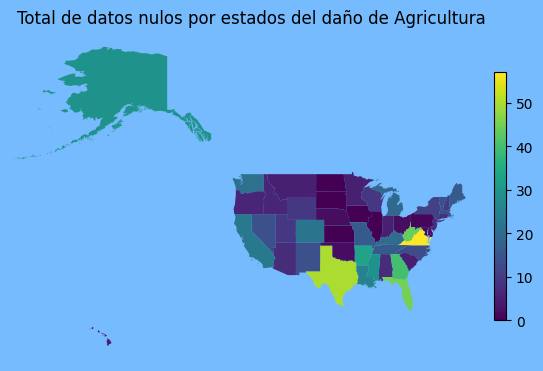

In [29]:
ax = geo_df_Agricultura.plot(cmap='viridis',column='Agricultural Damage (%) (4 major crops)')
ax.set_xlim(xmax=-60,xmin=-180)
#Se agrega colores a las graficas
norm = Normalize(vmin=geo_df_Agricultura['Agricultural Damage (%) (4 major crops)'].min(), vmax=geo_df_Agricultura['Agricultural Damage (%) (4 major crops)'].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='viridis')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap,fraction=0.025, pad=0)
ax.set_title('Total de datos nulos por estados del daño de Agricultura')
ax.set_axis_off()
ax.get_figure().set_facecolor('xkcd:sky blue')
plt.savefig('Output',dpi=1000)
plt.show()

Mapa de calor para variable Costas

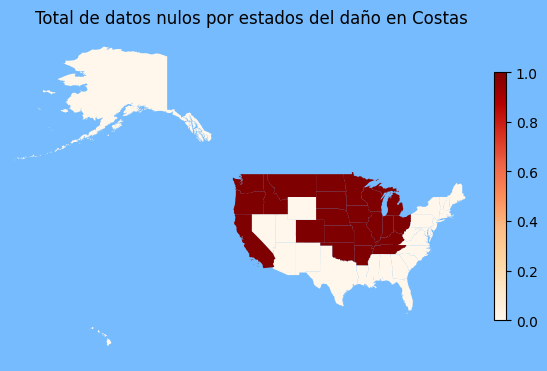

In [ ]:
### Graph the Medicare Payments to each State in Sum and GeoHeatMap ###
#Create plot of GeoMap data and format axes to be tight around US map
ax = geo_df_costa.plot(cmap='OrRd',column='Coastal damage (log10(% county income))')
ax.set_xlim(xmax=-60,xmin=-180)
#Add in continuous color bar
norm = Normalize(vmin=geo_df_costa['Coastal damage (log10(% county income))'].min(), vmax=geo_df_costa['Coastal damage (log10(% county income))'].max())
n_cmap = cm.ScalarMappable(norm=norm, cmap='OrRd')
n_cmap.set_array([])
ax.get_figure().colorbar(n_cmap,fraction=0.025, pad=0)
ax.set_title('Total de datos nulos por estados del daño en Costas')
ax.set_axis_off()
ax.get_figure().set_facecolor('xkcd:sky blue')
plt.savefig('Output',dpi=1000)
plt.show()

**CONCLUSION DE GRAFICOS NULOS**

1. De agricultura se observa....
2. De la variable daño a costas, inicialmente encontramos que me representan el 59% de valores nulos de mis datos, ahora observando el mapa de calor,relacionamos que las ciudades sin costa, tienen sentido que no tengan dato, es decir, esta es la razon por la cual puedo asumir los datos nulos de la variable como 0

In [30]:
#Cambio de datos nulos a 0 de la variable Daño de costa y Daño Agricultura
df['Agricultural Damage (%) (4 major crops)'] = df['Agricultural Damage (%) (4 major crops)'].fillna(0)
df['Coastal damage (log10(% county income))'] = df['Coastal damage (log10(% county income))'].fillna(0)

In [31]:
#Extraigo de mi DataFrame solo las variables numericas para hacer la exploracion
var_number=df.select_dtypes(exclude='object').columns

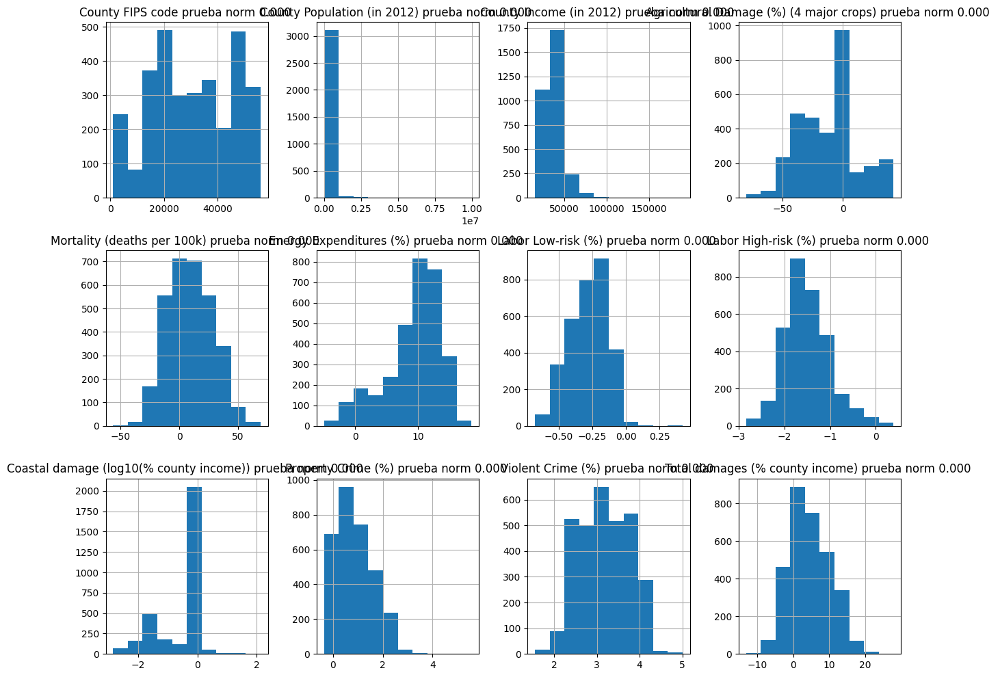

,County FIPS code,County Population (in 2012),County Income (in 2012),Agricultural Damage (%) (4 major crops),Mortality (deaths per 100k),Energy Expenditures (%),Labor Low-risk (%),Labor High-risk (%),Coastal damage (log10(% county income)),Property Crime (%),Violent Crime (%),Total damages (% county income)
0,0,0,0,0,0,0,0,0,0,0,0,0


In [32]:
#Prueba de shapiro para observar la normalidad de los datos
fig, axs = plt.subplots(3, 4, figsize=(15, 12))
for i,columna in enumerate(var_number):
    stat, p = stats.shapiro(df[[columna]].dropna())
    ax = axs[i // 4, i % 4]
    df[[columna]].hist(ax=ax)
    ax.set_title(f"{columna} prueba norm {p:.3f} ")
plt.show()
display(pd.DataFrame(df[var_number].isna().sum()).T)

Al ser  p (p-value) < 0.05, se rechaza la hipotesis nula y se acepta la alternativa, es decir, se concluye que ninguna de las variables sigue una distribucion normal




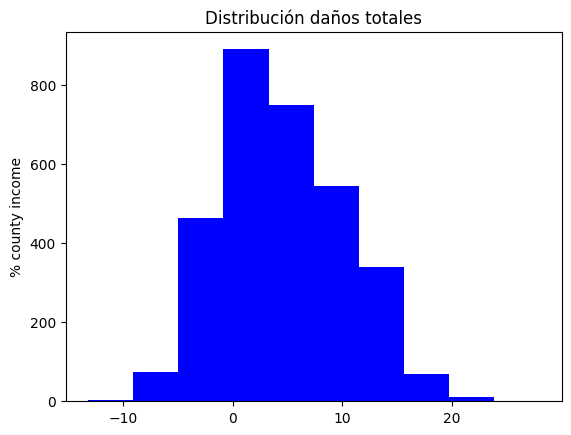

In [33]:
#Histograma de variable de interes
# Histograma
plt.hist(df['Total damages (% county income)'], bins=10, color='blue')
plt.title('Distribución daños totales')
plt.ylabel('% county income')
plt.show()

In [34]:
#Se eliminan las columnas que no me explican nada del comportamiento
columnas_a_eliminar = ['County FIPS code','County FIPS code','County Name']
df = df.drop(columns=columnas_a_eliminar)

Debido a que tenemos un cantidad extensa de Estados, se es necesario crear una subdivision de acuerdo a una division mas general de estos estados

In [35]:
df_split=pd.read_csv('/content/us census bureau regions and divisions.csv') #Data de trabajo
df_split.head(1)

,State,State Code,Region,Division
0,Alaska,AK,West,Pacific


In [36]:
#Realizo el cruce de estos dos data set
df['State Code'] = df['State Code'].astype(str)
df_split['State Code'] = df_split['State Code'].astype(str)

#Cruzo los data set por el nombre de la ciudad y elimino de USA lo que no me interesa
df_complet = df.merge(right=df_split,how='inner',left_on='State Code',right_on='State Code')
df_complet.head(2)

,State Code,County Population (in 2012),County Income (in 2012),Agricultural Damage (%) (4 major crops),Mortality (deaths per 100k),Energy Expenditures (%),Labor Low-risk (%),Labor High-risk (%),Coastal damage (log10(% county income)),Property Crime (%),Violent Crime (%),Total damages (% county income),State,Region,Division
0,AL,55192,35106,-16.003536,27.024584,11.998686,-0.515579,-2.120601,-2.051729,0.052951,2.369668,9.4390,Alabama,South,East South Central
1,AL,190560,38228,-12.974306,31.895386,12.066700,-0.378806,-1.937923,-0.698060,0.147257,2.495164,9.4078,Alabama,South,East South Central


In [37]:
#Creacion de variables dummies que me expliquen el comportamiento de los estados
df_final=pd.concat([df_complet,pd.get_dummies(df_complet['Division'],prefix='Region').astype(int)],axis=1)
df_final.head(1)

,State Code,County Population (in 2012),County Income (in 2012),Agricultural Damage (%) (4 major crops),Mortality (deaths per 100k),Energy Expenditures (%),Labor Low-risk (%),Labor High-risk (%),Coastal damage (log10(% county income)),Property Crime (%),Violent Crime (%),Total damages (% county income),State,Region,Division,Region_East North Central,Region_East South Central,Region_Middle Atlantic,Region_Mountain,Region_New England,Region_Pacific,Region_South Atlantic,Region_West North Central,Region_West South Central
0,AL,55192,35106,-16.003536,27.024584,11.998686,-0.515579,-2.120601,-2.051729,0.052951,2.369668,9.439,Alabama,South,East South Central,0,1,0,0,0,0,0,0,0


<Axes: >

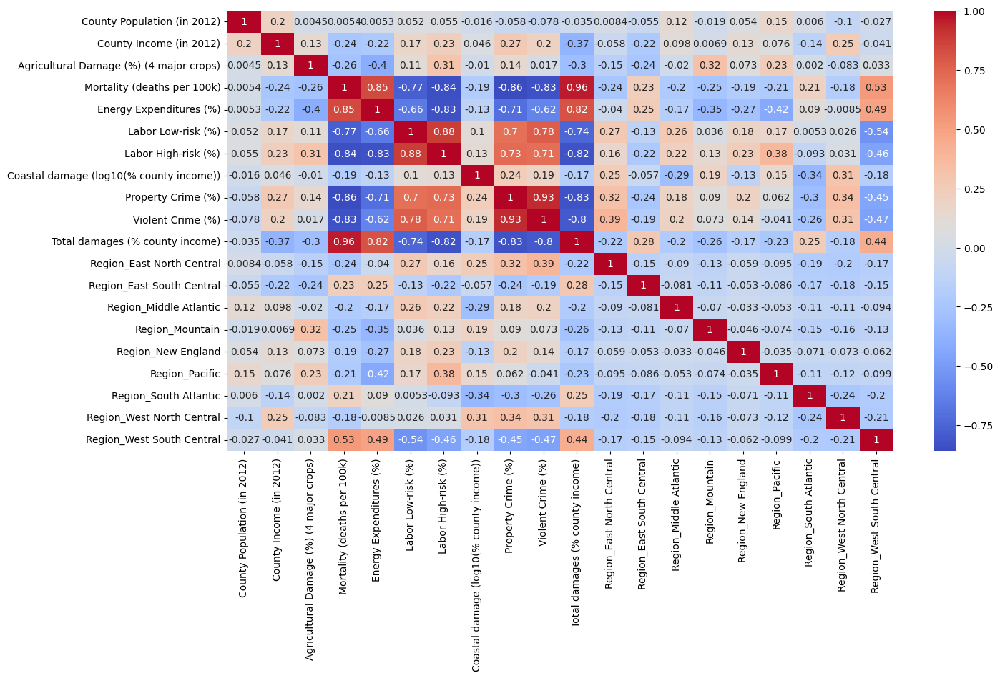

In [ ]:
var_number=df_final.select_dtypes(exclude='object').columns
plt.figure(figsize=(15, 8))
sns.heatmap(df_final[var_number].corr(), annot=True, cmap="coolwarm")

REGRESION LINEAL MULTIVARIABLE

In [38]:
import matplotlib.pyplot as plt
from statsmodels import api as sm
from sklearn.preprocessing import StandardScaler

En este punto observo que ya no me es Util la variable "State Code" puesto que actualmente la relacion de esta informacion se da con las variables dummies por region, por esta razon se procede a despreciarla en el dataset\

In [39]:
#Se eliminan las columnas que no me explican nada del comportamiento
Variables_objeto=df_final.select_dtypes(include='object').columns
df_final = df_final.drop(columns=Variables_objeto)

In [40]:
x=df_final[['County Population (in 2012)', 'County Income (in 2012)',
       'Agricultural Damage (%) (4 major crops)',
       'Mortality (deaths per 100k)', 'Energy Expenditures (%)',
       'Labor Low-risk (%)', 'Labor High-risk (%)',
       'Coastal damage (log10(% county income))', 'Property Crime (%)',
       'Violent Crime (%)','Region_East North Central', 'Region_East South Central',
       'Region_Middle Atlantic', 'Region_Mountain', 'Region_New England',
       'Region_Pacific', 'Region_South Atlantic', 'Region_West North Central',
       'Region_West South Central']]

In [41]:
y=df_final[['Total damages (% county income)']]

**POR SKLEARN**

In [42]:
sc = StandardScaler()
X = sc.fit_transform(x)

In [43]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state = 0,test_size=0.25)

In [44]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import linear_model

regr = linear_model.LinearRegression()
Modelo_SK=regr.fit(X_train,y_train)
y_pred = regr.predict(X_train)

In [45]:
coeficientes = regr.coef_
print(coeficientes)

[[-0.06565451 -0.79904643 -0.14224643  4.86926033  0.07349262 -0.15951161
  -0.20976978  0.17635749  0.39438499 -0.3982109  -0.09233176  0.16662739
   0.108364   -0.16446288  0.20001736 -0.07668654  0.24051853  0.0097682
  -0.2999873 ]]


In [46]:
interceptacion = regr.intercept_
print(interceptacion)

[4.57798575]


In [47]:
print("R Cuadrado: {}".format(r2_score(y_true=y_train,y_pred=y_pred)))

R Cuadrado: 0.9497558254012783


In [48]:
#Analisis de residuos
Residuos = y_train.values-y_pred
mean_residuals = np.mean(Residuos)
print("Mean de residuos {}".format(mean_residuals))

Mean de residuos 2.4116851447097163e-17


In [49]:
#Visualizacion de residuos
p = sns.scatterplot(y_pred,Residuos)
plt.xlabel('y_pred/Predicciones')
plt.ylabel('Residuos')
plt.ylim(-10,10)
plt.xlim(0,26)
p = sns.lineplot([0,26],[0,0],color='blue')
p = plt.title('Residuos vs gráfico de valores ajustados para la comprobación de homocedasticidad')

TypeError: scatterplot() takes from 0 to 1 positional arguments but 2 were given

In [50]:
#Prueba de Hipotesis
#Supuesto de Homohedasticidad
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(Residuos, X_train)
lzip(name, test)
#Dado que el valor p (0.916) es mayor que 0,05 en la prueba cuantitativa de Goldfeld,
#no podemos rechazar su hipótesis nula de que los términos de error son homocedásticos.

[('F statistic', 0.9220486077658423), ('p-value', 0.9164916661623086)]

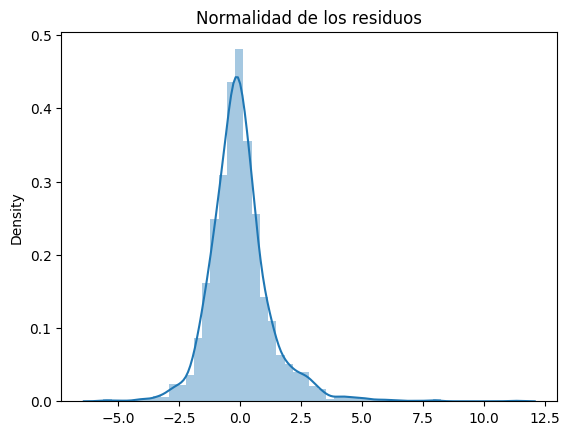

In [51]:
# Prueba de normalidad
p = sns.distplot(Residuos,kde=True)
p = plt.title('Normalidad de los residuos')

In [52]:
plt.figure(figsize=(10,5))
p = sns.lineplot(y_pred,Residuos,marker='o',color='blue')
plt.xlabel('y_pred/Predicciones')
plt.ylabel('Residuos')
plt.ylim(-10,10)
plt.xlim(0,26)
p = sns.lineplot([0,26],[0,0],color='red')
p = plt.title('Residuos vs gráfico de valores ajustados para la comprobación de autocorrelación')

TypeError: lineplot() takes from 0 to 1 positional arguments but 2 were given

<Figure size 1000x500 with 0 Axes>


**POR STATSMODEL**

In [53]:
#Se agrega la constante
X_stats=sm.add_constant(x)

In [54]:
#Se crea el modelo de regresion lineal
modelo=sm.OLS(y,X_stats)

In [55]:
#Entreno el modelo
modelo_fit=modelo.fit()

In [56]:
modelo_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                   OLS Regression Results                                  
===========================================================================================
Dep. Variable:     Total damages (% county income)   R-squared:                       0.947
Model:                                         OLS   Adj. R-squared:                  0.946
Method:                              Least Squares   F-statistic:                     3072.
Date:                             Tue, 06 Aug 2024   Prob (F-statistic):               0.00
Time:                                     23:32:47   Log-Likelihood:                -5285.5
No. Observations:                             3143   AIC:                         1.061e+04
Df Residuals:                                 3124   BIC:                         1.072e+04
Df Model:                                       18                                         
Covariance Type:                         nonrobust                                         
===========================================================================================================
                                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
const                                       4.5372      0.483      9.400      0.000       3.591       5.484
County Population (in 2012)             -2.297e-07    7.9e-08     -2.908      0.004   -3.84e-07   -7.48e-08
County Income (in 2012)                 -6.991e-05   2.49e-06    -28.115      0.000   -7.48e-05    -6.5e-05
Agricultural Damage (%) (4 major crops)    -0.0056      0.001     -4.571      0.000      -0.008      -0.003
Mortality (deaths per 100k)                 0.2587      0.004     69.553      0.000       0.251       0.266
Energy Expenditures (%)                     0.0077      0.017      0.451      0.652      -0.026       0.041
Labor Low-risk (%)                         -1.5108      0.510     -2.962      0.003      -2.511      -0.511
Labor High-risk (%)                        -0.4303      0.156     -2.752      0.006      -0.737      -0.124
Coastal damage (log10(% county income))     0.2827      0.039      7.218      0.000       0.206       0.359
Property Crime (%)                          0.3729      0.118      3.149      0.002       0.141       0.605
Violent Crime (%)                          -0.4687      0.162     -2.896      0.004      -0.786      -0.151
Region_East North Central                   0.1184      0.120      0.984      0.325      -0.118       0.354
Region_East South Central                   0.9578      0.101      9.482      0.000       0.760       1.156
Region_Middle Atlantic                      0.9998      0.122      8.193      0.000       0.760       1.239
Region_Mountain                            -0.1979      0.112     -1.772      0.076      -0.417       0.021
Region_New England                          1.6835      0.160     10.544      0.000       1.370       1.997
Region_Pacific                             -0.0097      0.124     -0.078      0.937      -0.252       0.233
Region_South Atlantic                       1.1209      0.079     14.158      0.000       0.966       1.276
Region_West North Central                   0.3365      0.118      2.851      0.004       0.105       0.568
Region_West South Central                  -0.4720      0.117     -4.031      0.000      -0.702      -0.242
==============================================================================
Omnibus:                     1213.236   Durbin-Watson:                   1.655
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            15659.338
Skew:                           1.465   Prob(JB):                         0.00
Kurtosis:                      13.535   Cond. No.                     3.62e+21
=============================================================

In [57]:
#predicciones
predictions = modelo_fit.predict(X_stats)

**PRUEBA DE SUPUESTOS**

In [58]:
from statsmodels.stats.stattools import durbin_watson

In [59]:
residuos = modelo_fit.resid

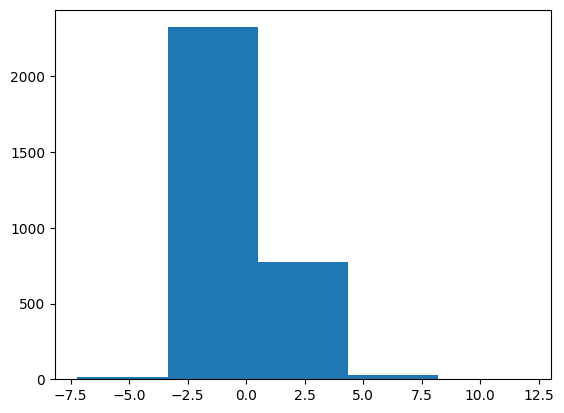

In [60]:
plt.hist(residuos,bins=5);

In [61]:
#1 - Prueba de normalidad de los residuos
from scipy.stats import shapiro
stat, p = shapiro(residuos)
print('stat=%.3f, p=%.3f' % (stat, p))
#Se rechaza la hipotesis nula y se dice que mis residuos no sigen la normalidad de los datos

stat=0.895, p=0.000


In [62]:
#2 - Prueba de idependencia de los errores
from statsmodels.stats.stattools import durbin_watson

#perform Durbin-Watson test
durbin_watson(residuos)
#1.5 y 2.5 puede concluirse que no existe dependencia de los residuos.

1.6554461088464274

In [ ]:
#3 - Supuesto de Homocedasticidad
#from statsmodels.stats.diagnostic import het_white

#het_white=het_white(residuos, sm.add_constant(X))
#print("p-value: ",het_white[1])

#Si el estadístico de la prueba excede el valor crítico, indica la presencia de heterocedasticidad

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
#Multicolinealidad: La presencia de alta correlación entre características puede
#afectar la interpretación de los coeficientes. Usa diagnósticos como el Factor de
#Inflación de Varianza (VIF) para detectar multicolinealidad.


#vif = df_total.drop('Total damages (% county income)', axis=1)
#Xvid = df_total.drop('Total damages (% county income)', axis=1)
#vif['Variable'] = 3143#Xvid.columns
#vif['VIF'] = [variance_inflation_factor(Xvid.values, i) for i in range(Xvid.shape[1])]
# Display variables with VIF > 5
#print(vif[vif['VIF'] > 5])

Realizamos un analisis de pesos de variables

VALIDACION DE SUPUESTOS DE COEFICIENTES